Data Compression- Here, ground truth pixel values are not missing- you have access to them. You want to explore the use of matrix factorisation in order to store them more efficiently.<br>

- Consider an image patch of size (NxN) where N=50. We are trying to compress this patch (matrix) into two matrices, by using low-rank matrix factorization. Consider the following three cases-
- a patch with mainly a single color.
- a patch with 2-3 different colors.
- a patch with at least 5 different colors.<br><br>
Vary the low-rank value as r = [5, 10, 25, 50] for each of the cases. Use Gradient Descent and plot the reconstructed patches over the original image (retaining all pixel values outside the patch, and using your learnt compressed matrix in place of the patch) to demonstrate difference in reconstruction quality. Write your observations. 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import torch
import torch.nn as nn
import torch.nn.functional as F
import tensorflow as tf
import torch.optim as optim
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
# Image completion
import os
if os.path.exists('dog.jpg'):
    print('dog.jpg exists')
else:
    !wget https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg -O dog.jpg

dog.jpg exists


In [3]:
# Read in a image from torchvision
import torchvision
img = torchvision.io.read_image("dog.jpg")
print(img.shape)

torch.Size([3, 1365, 2048])


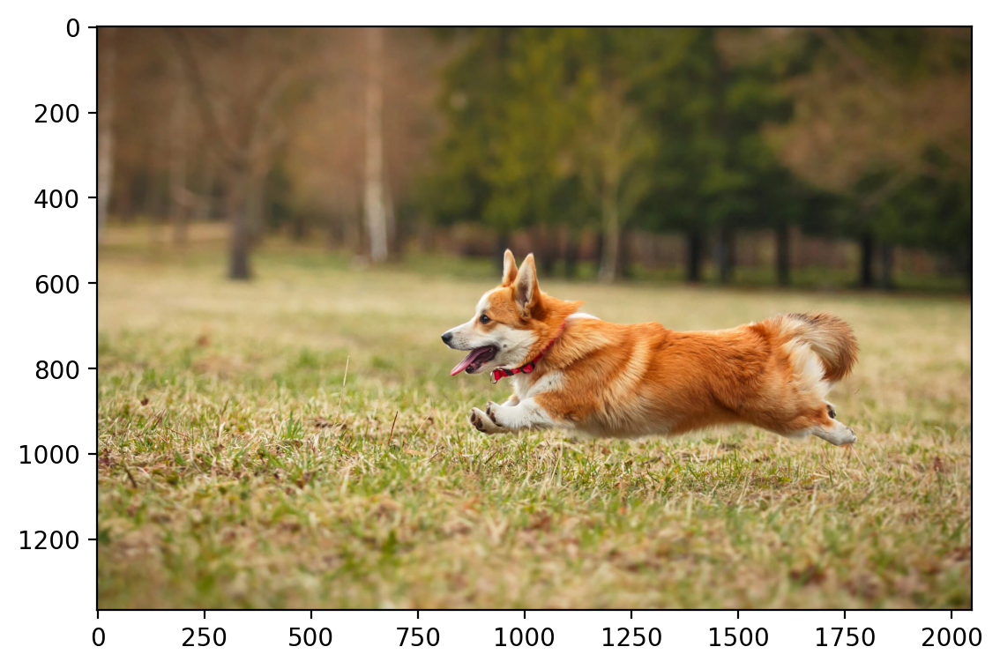

In [4]:
plt.imshow(img.permute(1,2,0).numpy().astype('uint8'))

In [5]:
# Extract patches surrounding the missing patch
def extract_patches(img,top_left,hight,width):
    x,y = top_left
    patches = torchvision.transforms.functional.crop(img,y,x,hight,width)
    return patches

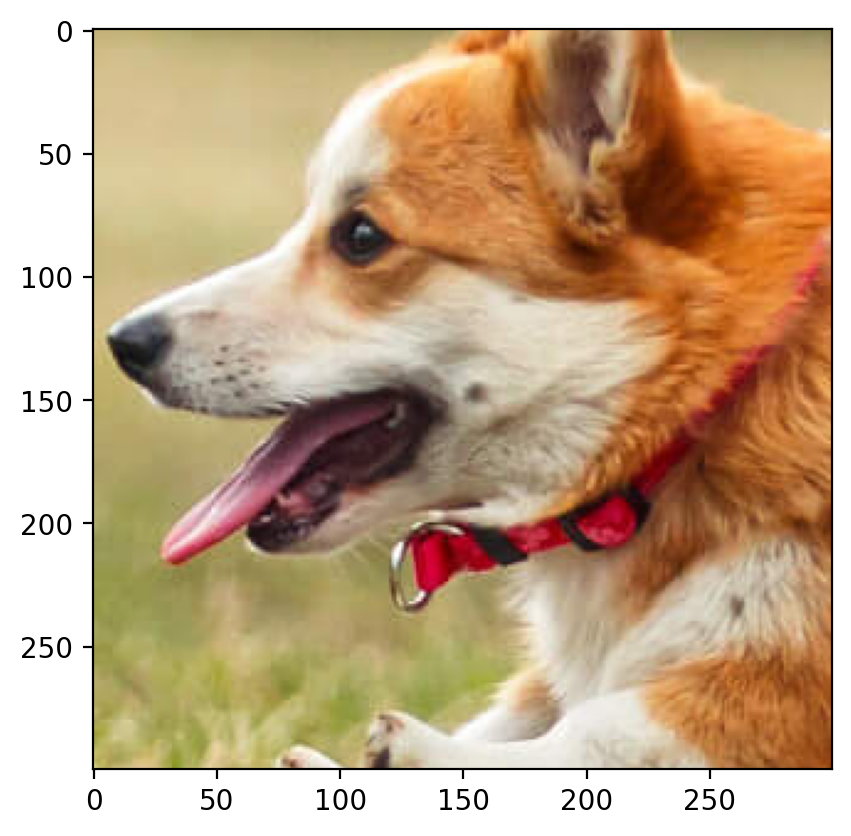

In [6]:
dog = extract_patches(img,(800,600),300,300)
plt.imshow(dog.permute(1,2,0).numpy())

In [7]:
def img_missing_patches(img,top_left,hight,width):
    y,x = top_left
    patches = extract_patches(img,top_left,hight,width)
    patches_copy = patches.clone().float()
    mask = torch.rand(patches.shape) <= 1
    patches_copy[mask] = float('nan')
    img_copy = img.clone().float()
    img_copy[:,x:x+width,y:y+hight] = patches_copy
    return img_copy,patches,patches_copy
# patch_removed_img,patch,patch_copy=img_missing_patches(dog,(0,0),30,30)
# patch_copy

In [8]:
# Define a function to factorize the matrix
def factorize(A, k,device=torch.device("cpu"), max_iter = 10000,convergence_threshold = 1e-6,lambda_reg=0.1):
    """Factorize the matrix A into two matrices W and H."""
    A = A.to(device)
    lst = []
    for i in range(3):
       
        # Randomly initialize matrices W and H
        W_r = torch.randn(A[i].shape[1], k, requires_grad=True, device=device)
        H_r = torch.randn(k, A[i].shape[1], requires_grad=True, device=device)
        # Adam optimizer
        optimizer = optim.Adam([W_r, H_r], lr=0.01)
        mask = ~torch.isnan(A[i])
        prev_loss = float('inf')
        for iteration in range(max_iter):
        
            # Compute the loss
            #print(torch.matmul(W_r, H_r).shape)
            diff_matrix = torch.matmul(W_r, H_r) - A[i]
            diff_vector = diff_matrix[mask]
            regularization = lambda_reg * (torch.norm(W_r) + torch.norm(H_r))
            loss = torch.norm(diff_vector)+ regularization

            if iteration > 0 and abs(prev_loss - loss.item()) < convergence_threshold:
                print(f'Converged after {iteration} iterations')
                break
            # Zero the gradients
            optimizer.zero_grad()
        
            # Backpropagate
            loss.backward()
        
            # Update the parameters
            optimizer.step()
            prev_loss = loss.item()
        
        lst.append(torch.clone(torch.matmul(W_r, H_r).detach()))
        #print(lst[i].shape)

    A_re = torch.stack([lst[0],lst[1],lst[2]], dim=0)
        
    #print(A_re)
    return A_re

In [33]:
def save_figure(patche,re_patch,img, completed_img):
    """Save the original and completed images as figures."""
    # Create the directory to store figures if it doesn't exist
    # if not os.path.exists(folder):
    #     os.makedirs(folder)

    # Plot both the original image and the completed image simultaneously
    plt.figure(figsize=(18, 6))  # Adjust the size as needed
    plt.subplot(1, 4, 1)
    plt.imshow((patche/255).permute(1, 2, 0).numpy())
    plt.title('Original Patch')
    

    
    plt.subplot(1, 4, 2)
    plt.imshow((img/255).permute(1, 2, 0).numpy())
    plt.title('Original Image')

    plt.subplot(1, 4, 3)
    plt.imshow((re_patch/255).permute(1, 2, 0).numpy())
    plt.title('Reconstructed Patch')

    plt.subplot(1, 4, 4)
    plt.imshow((completed_img/255).detach().permute(1, 2, 0).numpy())
    plt.title('Reconstructed Patch overlaying')
   
    # Save the figure with the specified name in the folder
    # plt.savefig(os.path.join(folder, f"{name}.png"))
    plt.show()
    plt.close()


In [56]:
def plot_rmse_psnr(Y1_rmse,Y2_psnr,title="Metric Plots"):
    X=["r=5","r=10","r=25","r=50"]
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 2, 1)
    plt.bar(np.arange(len(X)), Y1_rmse, 0.4,label="RMSE")
    plt.xticks(np.arange(len(X)),X)
    plt.ylabel("RMSE")
    plt.xlabel("r")

    plt.subplot(1, 2, 2)
    plt.bar(np.arange(len(X)), Y2_psnr, 0.4,label="PSNR",color="red")
    plt.xticks(np.arange(len(X)),X)
    plt.ylabel("PSNR")
    plt.xlabel("r")
    plt.suptitle(title)
    plt.show()

In [20]:
def overlay_patch(original_image, patch_image, top_left):
    # Extract dimensions
    original_height, original_width = original_image.shape[1], original_image.shape[2]
    patch_height, patch_width = patch_image.shape[1], patch_image.shape[2]

    # Extract top-left coordinates
    x, y = top_left

    # Ensure the patch fits within the original image
    if x + patch_width > original_width or y + patch_height > original_height:
        raise ValueError("Patch image exceeds dimensions of original image")

    # Copy the original image to avoid modifying the original
    result_image = original_image.clone()

    # Overlay the patch image onto the result image
    result_image[:, y:y+patch_height, x:x+patch_width] = patch_image

    return result_image

## Metrics

In [35]:
# RMSE
def rmse(re_img, original_img):
    mse=np.mean(np.square(re_img-original_img))
    return np.sqrt(mse)

# Peak signal to noise ratio
def psnr(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    max_pixel = np.max(img1)
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr

### A patch with mainly a single color

In [14]:
top_left1=(0,0)
N=50
r=[5,10,25,50]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


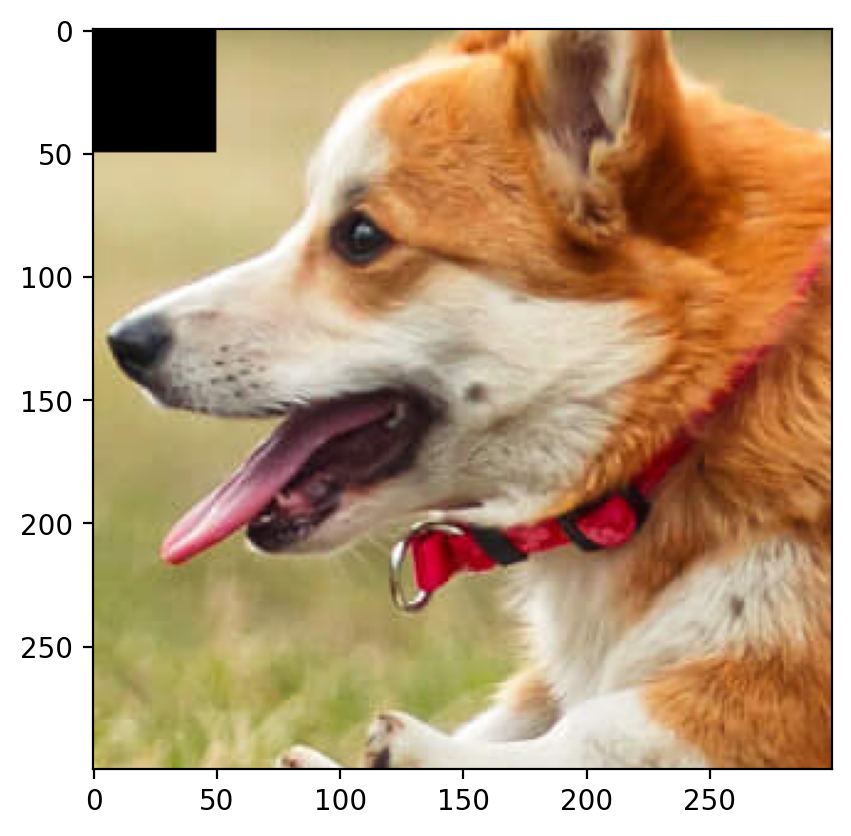

In [17]:
img_removed_patch1,_,_=img_missing_patches(dog,top_left1,N,N)
plt.imshow(img_removed_patch1.int().permute(1,2,0).numpy())

In [10]:
patch1=extract_patches(dog,top_left1,N,N)
re_patch1_r5 =factorize(patch1,r[0])
re_patch1_r10=factorize(patch1,r[1])
re_patch1_r25=factorize(patch1,r[2])
re_patch1_r50=factorize(patch1,r[3])

Converged after 2652 iterations
Converged after 3728 iterations
Converged after 3239 iterations
Converged after 4260 iterations
Converged after 4527 iterations
Converged after 4051 iterations
Converged after 1770 iterations
Converged after 1956 iterations


In [21]:
overlay_re_patch1_r5=overlay_patch(dog,re_patch1_r5,top_left1)
overlay_re_patch1_r10=overlay_patch(dog,re_patch1_r10,top_left1)
overlay_re_patch1_r25=overlay_patch(dog,re_patch1_r25,top_left1)
overlay_re_patch1_r50=overlay_patch(dog,re_patch1_r50,top_left1)

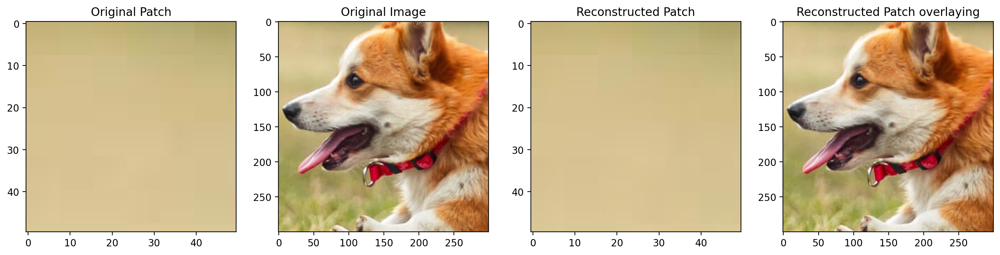

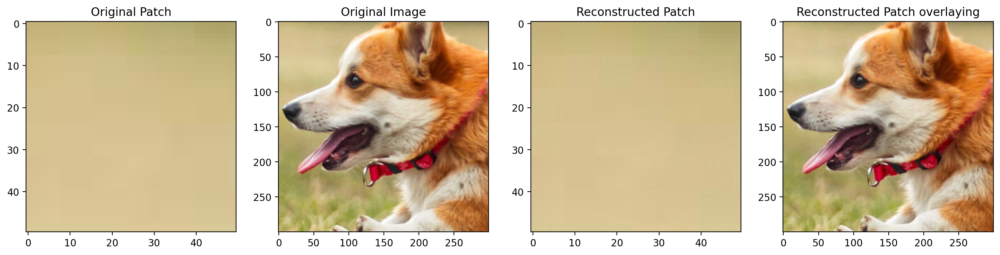

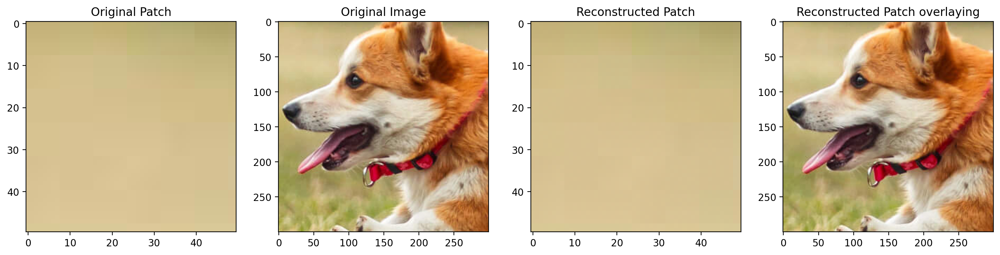

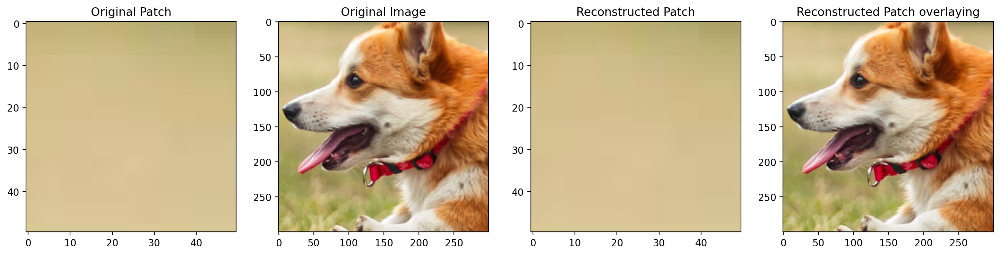

In [34]:
save_figure(patch1,re_patch1_r5,dog,overlay_re_patch1_r5)
save_figure(patch1,re_patch1_r10,dog,overlay_re_patch1_r10)
save_figure(patch1,re_patch1_r25,dog,overlay_re_patch1_r25)
save_figure(patch1,re_patch1_r50,dog,overlay_re_patch1_r50)

In [36]:
rmse_patch1_r5=rmse(re_patch1_r5.numpy(),patch1.numpy())
rmse_patch1_r10=rmse(re_patch1_r10.numpy(),patch1.numpy())
rmse_patch1_r25=rmse(re_patch1_r25.numpy(),patch1.numpy())
rmse_patch1_r50=rmse(re_patch1_r50.numpy(),patch1.numpy())

psnr_patch1_r5=psnr(re_patch1_r5.numpy(),patch1.numpy())
psnr_patch1_r10=psnr(re_patch1_r10.numpy(),patch1.numpy())
psnr_patch1_r25=psnr(re_patch1_r25.numpy(),patch1.numpy())
psnr_patch1_r50=psnr(re_patch1_r50.numpy(),patch1.numpy())

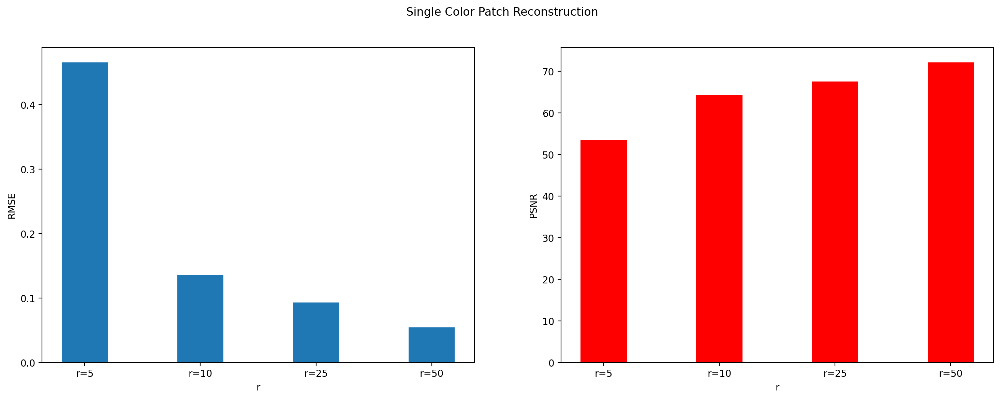

In [57]:
Y1_rmse=[rmse_patch1_r5,rmse_patch1_r10,rmse_patch1_r25,rmse_patch1_r50]
Y1_psnr=[psnr_patch1_r5,psnr_patch1_r10,psnr_patch1_r25,psnr_patch1_r50]
plot_rmse_psnr(Y1_rmse,Y1_psnr,title="Single Color Patch Reconstruction")

### A patch with 2-3 different colors.

In [49]:
top_left2=(30,55)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


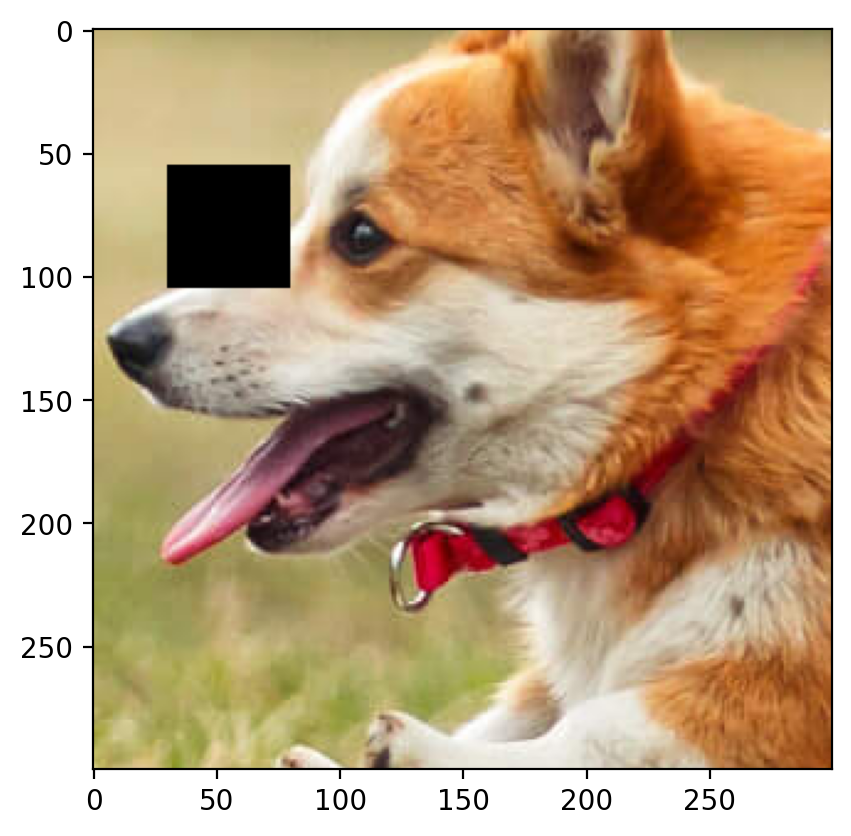

In [51]:
img_removed_patch2,_,_=img_missing_patches(dog,top_left2,N,N)
plt.imshow(img_removed_patch2.int().permute(1,2,0).numpy())
plt.show()

In [52]:
patch2=extract_patches(dog,top_left2,N,N)
re_patch2_r5 =factorize(patch2,r[0])
re_patch2_r10=factorize(patch2,r[1])
re_patch2_r25=factorize(patch2,r[2])
re_patch2_r50=factorize(patch2,r[3])

Converged after 3964 iterations
Converged after 3125 iterations
Converged after 2601 iterations
Converged after 4793 iterations
Converged after 4387 iterations
Converged after 3924 iterations
Converged after 4183 iterations
Converged after 3443 iterations
Converged after 3574 iterations


In [53]:
overlay_re_patch2_r5 =overlay_patch(dog,re_patch2_r5, top_left2)
overlay_re_patch2_r10=overlay_patch(dog,re_patch2_r10,top_left2)
overlay_re_patch2_r25=overlay_patch(dog,re_patch2_r25,top_left2)
overlay_re_patch2_r50=overlay_patch(dog,re_patch2_r50,top_left2)

In [54]:
rmse_patch2_r5 =rmse(re_patch2_r5.numpy(), patch2.numpy())
rmse_patch2_r10=rmse(re_patch2_r10.numpy(),patch2.numpy())
rmse_patch2_r25=rmse(re_patch2_r25.numpy(),patch2.numpy())
rmse_patch2_r50=rmse(re_patch2_r50.numpy(),patch2.numpy())

psnr_patch2_r5 =psnr(re_patch2_r5.numpy(), patch2.numpy())
psnr_patch2_r10=psnr(re_patch2_r10.numpy(),patch2.numpy())
psnr_patch2_r25=psnr(re_patch2_r25.numpy(),patch2.numpy())
psnr_patch2_r50=psnr(re_patch2_r50.numpy(),patch2.numpy())

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


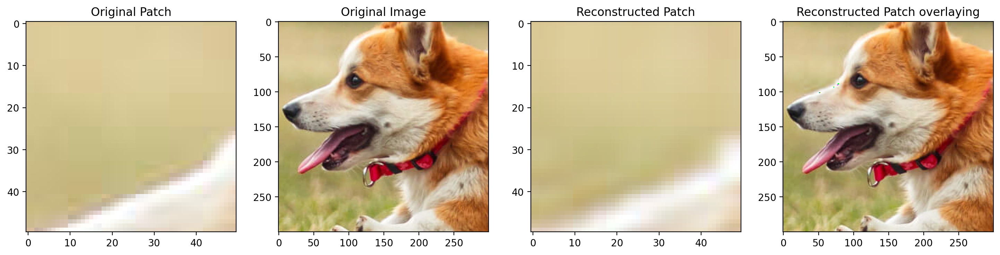

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


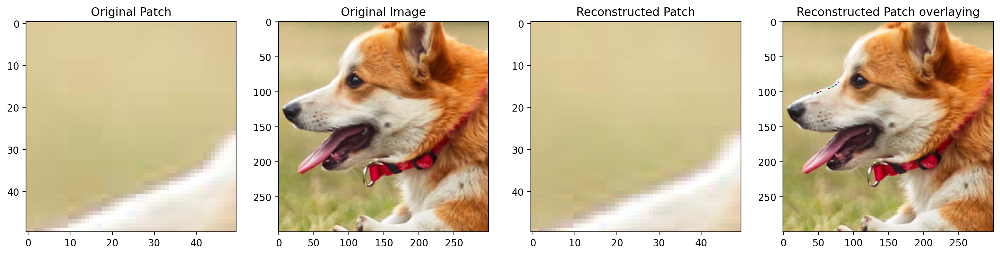

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


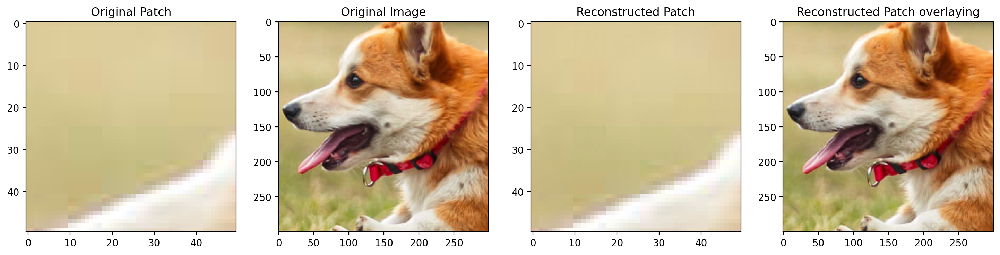

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


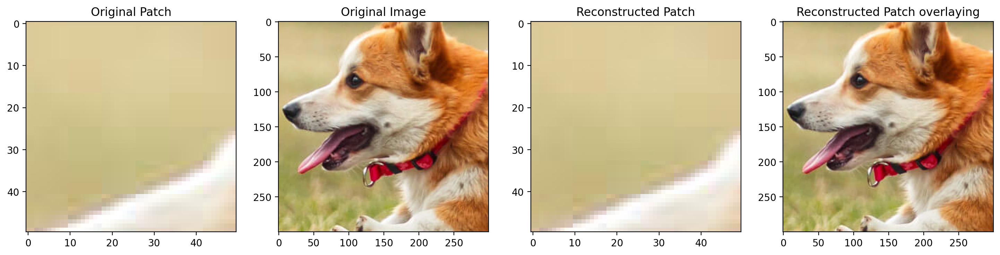

In [55]:
save_figure(patch2,re_patch2_r5, dog,overlay_re_patch2_r5)
save_figure(patch2,re_patch2_r10,dog,overlay_re_patch2_r10)
save_figure(patch2,re_patch2_r25,dog,overlay_re_patch2_r25)
save_figure(patch2,re_patch2_r50,dog,overlay_re_patch2_r50)

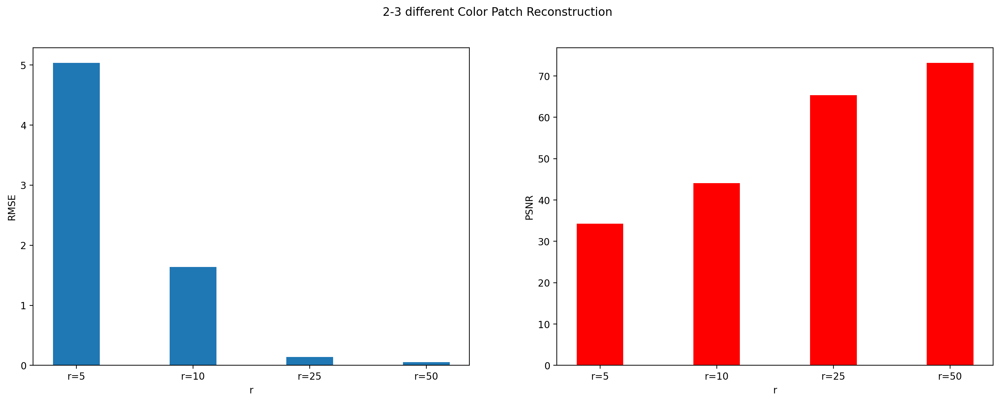

In [59]:
Y2_rmse=[rmse_patch2_r5,rmse_patch2_r10,rmse_patch2_r25,rmse_patch2_r50]
Y2_psnr=[psnr_patch2_r5,psnr_patch2_r10,psnr_patch2_r25,psnr_patch2_r50]
plot_rmse_psnr(Y2_rmse,Y2_psnr,title="2-3 different Color Patch Reconstruction")

### A patch with at least 5 different colors

In [64]:
top_left3=(90,180)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


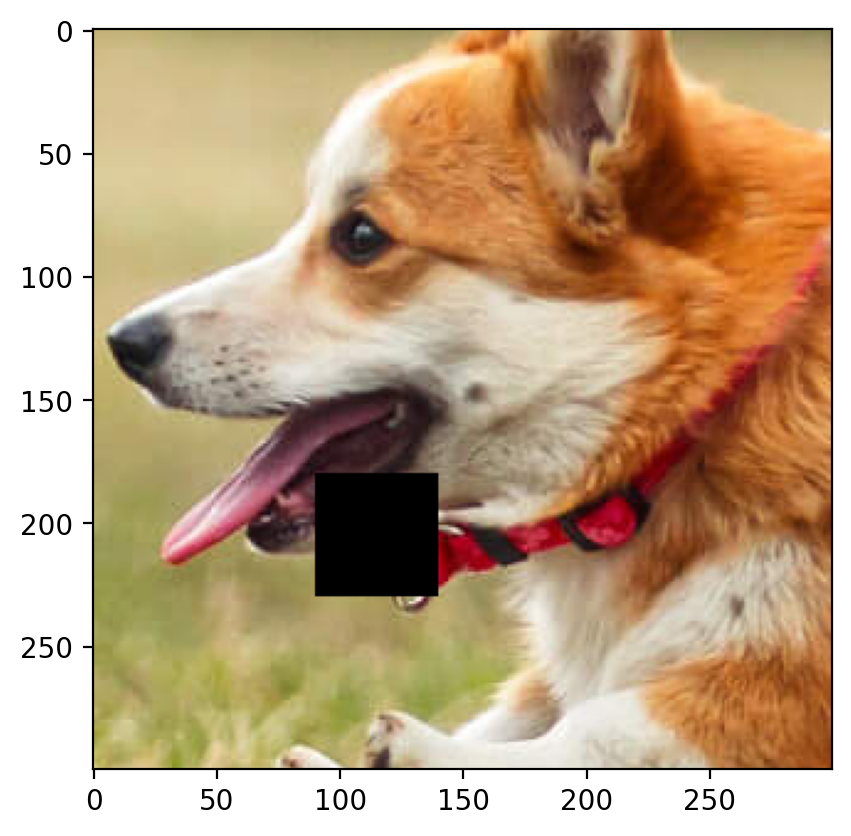

In [65]:
img_removed_patch3,_,_=img_missing_patches(dog,top_left3,N,N)
plt.imshow(img_removed_patch3.int().permute(1,2,0).numpy())
plt.show()

In [66]:
patch3=extract_patches(dog,top_left3,N,N)
re_patch3_r5 =factorize(patch3,r[0])
re_patch3_r10=factorize(patch3,r[1])
re_patch3_r25=factorize(patch3,r[2])
re_patch3_r50=factorize(patch3,r[3])

Converged after 3219 iterations
Converged after 2822 iterations
Converged after 3344 iterations
Converged after 3799 iterations
Converged after 2403 iterations
Converged after 2823 iterations
Converged after 2104 iterations
Converged after 2448 iterations
Converged after 2533 iterations


In [67]:
overlay_re_patch3_r5 =overlay_patch(dog,re_patch3_r5, top_left3)
overlay_re_patch3_r10=overlay_patch(dog,re_patch3_r10,top_left3)
overlay_re_patch3_r25=overlay_patch(dog,re_patch3_r25,top_left3)
overlay_re_patch3_r50=overlay_patch(dog,re_patch3_r50,top_left3)

In [68]:
rmse_patch3_r5 =rmse(re_patch3_r5.numpy(), patch3.numpy())
rmse_patch3_r10=rmse(re_patch3_r10.numpy(),patch3.numpy())
rmse_patch3_r25=rmse(re_patch3_r25.numpy(),patch3.numpy())
rmse_patch3_r50=rmse(re_patch3_r50.numpy(),patch3.numpy())

psnr_patch3_r5 =psnr(re_patch3_r5.numpy(), patch3.numpy())
psnr_patch3_r10=psnr(re_patch3_r10.numpy(),patch3.numpy())
psnr_patch3_r25=psnr(re_patch3_r25.numpy(),patch3.numpy())
psnr_patch3_r50=psnr(re_patch3_r50.numpy(),patch3.numpy())

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


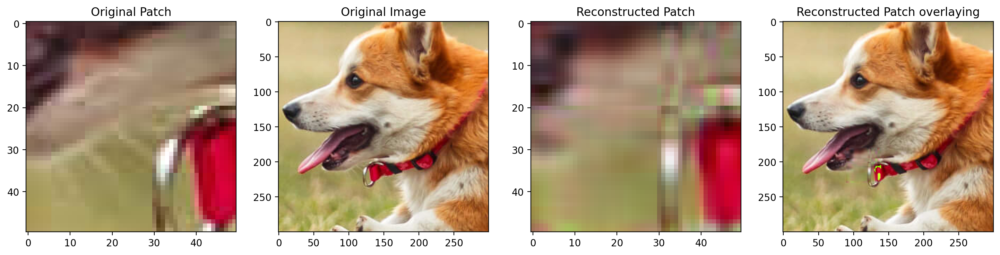

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


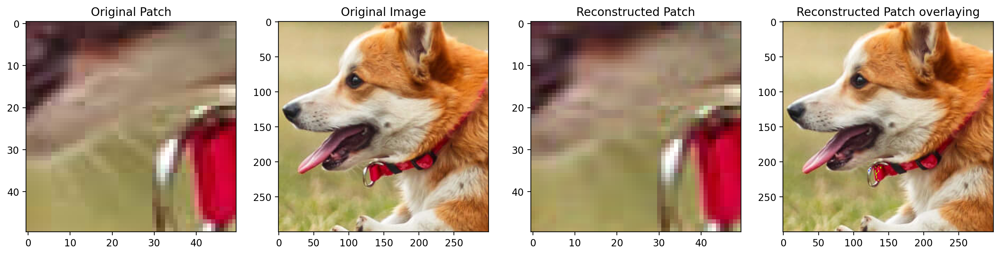

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


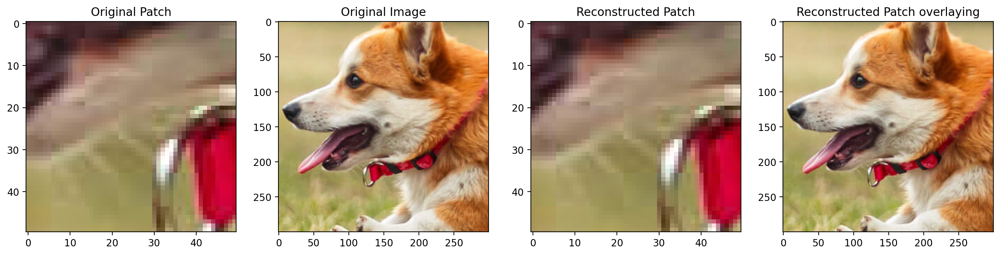

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


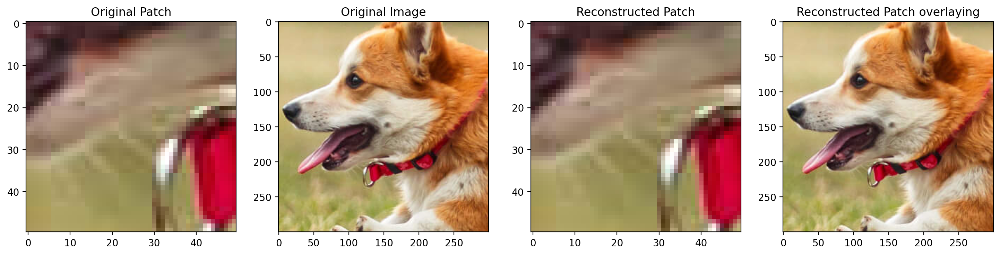

In [69]:
save_figure(patch3,re_patch3_r5, dog,overlay_re_patch3_r5)
save_figure(patch3,re_patch3_r10,dog,overlay_re_patch3_r10)
save_figure(patch3,re_patch3_r25,dog,overlay_re_patch3_r25)
save_figure(patch3,re_patch3_r50,dog,overlay_re_patch3_r50)

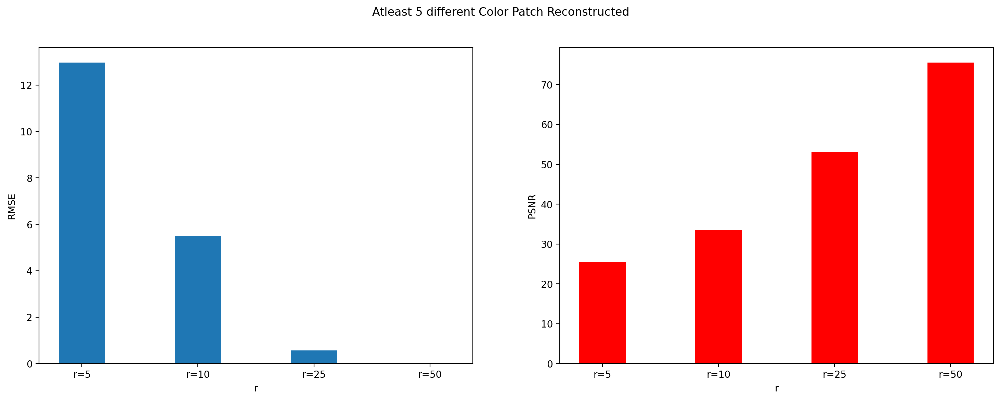

In [70]:
Y3_rmse=[rmse_patch3_r5,rmse_patch3_r10,rmse_patch3_r25,rmse_patch3_r50]
Y3_psnr=[psnr_patch3_r5,psnr_patch3_r10,psnr_patch3_r25,psnr_patch3_r50]
plot_rmse_psnr(Y3_rmse,Y3_psnr,title="Atleast 5 different Color Patch Reconstructed")